In [1]:
%matplotlib notebook

In [1]:
import numpy as np
from mpmath import zetazero

from sympy import primepi, li

# scipy.special.zeta doesnt work with complex
# but can handle np arrays so is faster
# from scipy.special import zeta
# sympy.zeta works with complex
from sympy import zeta

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from celluloid import Camera
from matplotlib import animation
from IPython.display import HTML
from matplotlib.animation import FuncAnimation, FFMpegWriter

In [2]:
import matplotlib
matplotlib.use("TkAgg")

### Prime counting function

In [2]:
x = np.array(range(2,10001))

y_pi = list(map(primepi, tqdm(x)))
print(primepi(100))

  0%|          | 0/9999 [00:00<?, ?it/s]

25


### Asymptotic law of distribution of prime numbers

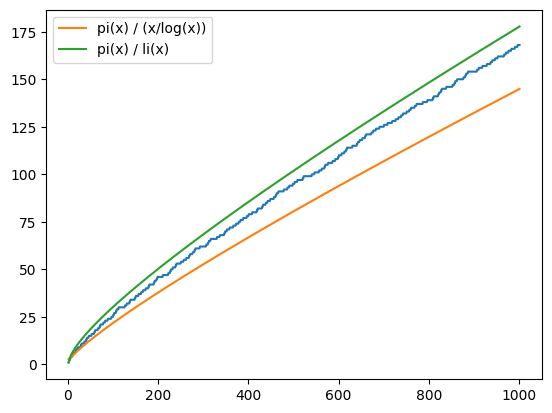

In [3]:
n = 1000
plt.plot(x[:n],y_pi[:n])

y_log = x/np.log(x)
plt.plot(x[:n], y_log[:n], label='pi(x) / (x/log(x))')

y_Li = list(map(li, x))
y_Li = np.array(y_Li)
plt.plot(x[:n], y_Li[:n], label='pi(x) / li(x)')

plt.legend()
plt.show()

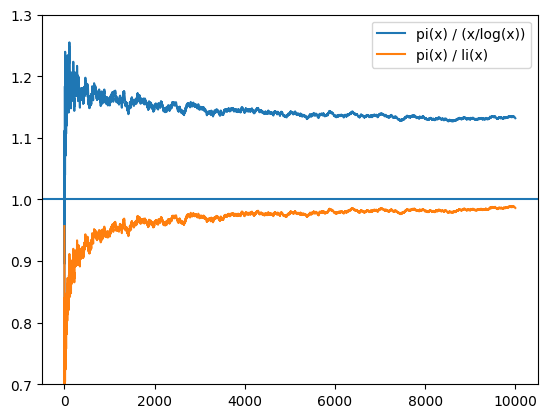

In [4]:
plt.plot(x, y_pi/y_log, label='pi(x) / (x/log(x))')
plt.plot(x, y_pi/y_Li, label='pi(x) / li(x)')
plt.ylim(0.7, 1.3)
plt.axhline(y=1)
plt.legend()
plt.show()

### Visualizing non-trivial zeros of the zeta function

Zeros of zeta function represented as $ \frac{1}{2} + i\gamma_n $ such that $\zeta(\frac{1}{2} + i\gamma_n) = 0 $
$$ \gamma_n \approx 2\pi \frac{n-\frac{11}{8}}{W\left(\frac{n-\frac{11}{8}}{e}\right)} $$

Gram points represented as $ \frac{1}{2} + i g_n $ such that $\Im(\frac{1}{2} + i g_n) = 0 $
and $\zeta(\frac{1}{2} + i g_n) \neq 0 $ \
which means $\zeta(\frac{1}{2} + i\gamma_n)$ is real and non zero
$$ g_n \approx 2\pi e^{1+W\left(\frac{8n+1}{8e}\right)} $$

Riemann zeta function along the critical line with Re(s) = 1/2. Real values are shown on the horizontal axis and imaginary values are on the vertical axis). Re(ζ(1/2 + it), Im(ζ(1/2 + it) is plotted with t ranging between −30 and 30.
The curve starts for t = -30 at ζ(1/2 - 30 i) = -0.12 + 0.58 i, and end symmetrically below the starting point at ζ(1/2 + 30 i) = -0.12 - 0.58 i.

Six zeros of ζ(s) are found along the trajectory when the origin (0,0) is traversed, corresponding to imaginary parts Im(s) = ±14.135, ±21.022 and ±25.011.

In [2]:
from scipy.signal import argrelmin


imag_range = np.linspace(-30,30,1001)
x = .5 + 1j*imag_range
y = np.array(list(map(lambda z: complex(zeta(z)), tqdm(x))))


thresh = 1e-1

# for zeros of zeta function
y_abs = abs(y)
y_local_mins_indxs = argrelmin(y_abs)[0]
zeros_mask = y_abs[y_local_mins_indxs] < thresh
zeta_zeros = x[y_local_mins_indxs[zeros_mask]]
n_zeros = len(zeta_zeros)

# for gram points
y_im = abs(y.imag)
y_local_mins_indxs = argrelmin(y_im)[0]
re_mask = y_im[y_local_mins_indxs] < thresh
gram_points = x[y_local_mins_indxs[re_mask]]
# remove zeros as they would also have imaginary part as 0
gram_points = np.array(list(set(gram_points) - set(zeta_zeros)))
n_gram_points = len(gram_points)

zeros_mask = np.isin(x, zeta_zeros)
gram_mask = np.isin(x, gram_points)

# fig, axs = plt.subplots(2,1, figsize=(8,12)) # vertical
# fig, axs = plt.subplots(1,2, figsize=(15,5)) # horizontal

# plt.axes(axs[0])
# plt.plot(y.real, y.imag)
# plt.scatter(y[gram_mask].real, y[gram_mask].imag, c='black', label='gram point', zorder=5)
# plt.scatter(0, 0, c='yellow', label='zeta zero', zorder=5)
# plt.xlabel('Re(ζ(1/2 + it))')
# plt.ylabel('Im(ζ(1/2 + it))')
# plt.axhline(0, ls='--', c='k')
# plt.axvline(0, ls='--', c='k')
# plt.legend(loc='upper left')

# plt.axes(axs[1])
# plt.plot(imag_range, y.real, c='red', label='Re(ζ(1/2 + it))')
# plt.plot(imag_range, y.imag, c='blue', label='Im(ζ(1/2 + it))')
# plt.scatter(zeta_zeros.imag, [0]*n_zeros, c='yellow', label='zeta zero', zorder=5)
# plt.scatter(gram_points.imag, [0]*n_gram_points, c='black', label='gram point', zorder=5)
# plt.xlabel('t')
# plt.axhline(0, ls='--', c='k')
# plt.axvline(0, ls='--', c='k')
# plt.legend(loc='upper center')

# plt.show()

print(f'{n_zeros} zeros found at: {np.round(zeta_zeros,3)}')
print(f'imaginary parts: +/- {sorted(set(np.round(abs(zeta_zeros.imag), 3)))}')
print()
print(f'{n_gram_points} gram points found at: {np.round(gram_points,3)}')
print(f'imaginary parts: +/- {sorted(set(np.round(abs(gram_points.imag), 3)))}')

  0%|          | 0/1001 [00:00<?, ?it/s]

6 zeros found at: [0.5-25.02j 0.5-21.j   0.5-14.16j 0.5+14.16j 0.5+21.j   0.5+25.02j]
imaginary parts: +/- [14.16, 21.0, 25.02]

11 gram points found at: [0.5 +0.j   0.5+23.16j 0.5 -9.66j 0.5-23.16j 0.5 +3.42j 0.5-17.82j
 0.5-27.66j 0.5+27.66j 0.5+17.82j 0.5 -3.42j 0.5 +9.66j]
imaginary parts: +/- [0.0, 3.42, 9.66, 17.82, 23.16, 27.66]


#### animated

In [45]:
colrs = np.array(plt.rcParams['axes.prop_cycle'].by_key()['color'])
# colrs = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
# colrs = ['blue', 'black', 'red', 'yellow', 'purple', 'orange']

def animate():
  # fig, axs = plt.subplots(2,1, figsize=(8,12)) # vertical
  fig, axs = plt.subplots(1,2, figsize=(15,5)) # horizontal
  # adjust bottom so that text can easily fit below the image
  plt.subplots_adjust(bottom=0.15)
  camera = Camera(fig)
  
  n_z, n_g = 0, 0
  zeros_indxs, gram_indxs = [], []
  for i, t in enumerate(tqdm(imag_range)):
    z = y[i]
    if any(np.isclose(t, zeta_zeros.imag)):
      zeros_indxs.append(i)
      n_z += 1
    if any(np.isclose(t, gram_points.imag)):
      gram_indxs.append(i)
      n_g += 1
    
    if i%1 == 0:  # plot and snap every 10 frames
      
      # plot first subplot
      plt.axes(axs[0])

      # to plot with different colors
      plt.axhline(0, ls='--', c='k')
      plt.axvline(0, ls='--', c='k')
      if not zeros_indxs:
          plt.plot(y.real[:i+1], y.imag[:i+1], c=colrs[0])
      else:
        j, indx2 = 0, zeros_indxs[0]
        plt.plot(y.real[:indx2], y.imag[:indx2], c=colrs[0])

        for j in range(n_z-1):
          indx1, indx2 = zeros_indxs[j], zeros_indxs[j+1]
          plt.plot(y.real[indx1:indx2], y.imag[indx1:indx2], c=colrs[(j+1)%len(colrs)])
        if n_z > 1:
          j += 1

        if indx2 <= i:
          plt.plot(y.real[indx2:i+1], y.imag[indx2:i+1], c=colrs[(j+1)%len(colrs)])
      # to plot with single colr
      # plt.plot(y.real[:i+1], y.imag[:i+1], c='#1f77b4')
      
      # plt.scatter(z.real, z.imag, c='green')
      if zeros_indxs:
        plt.scatter(0, 0, c=colrs[(n_z-1)%len(colrs)], zorder=5)
      if gram_indxs:
        gram_mask = np.isin(x, gram_points)
        plt.scatter(y[gram_indxs].real, y[gram_indxs].imag, c='black', label='gram point', zorder=5)
      plt.xlabel('Re(ζ(1/2 + it)')
      plt.ylabel('Im(ζ(1/2 + it)')
      
      
      
      # plot second subplot
      plt.axes(axs[1])
      plt.axhline(0, ls='--', c='k')
      plt.axvline(0, ls='--', c='k')
      if i==0:
        plt.plot(imag_range[:i], y.real[:i], c='red', label='Re(ζ(1/2 + it))')
        plt.plot(imag_range[:i], y.imag[:i], c='blue', label='Im(ζ(1/2 + it))')
      else:
        plt.plot(imag_range[:i], y.real[:i], c='red')
        plt.plot(imag_range[:i], y.imag[:i], c='blue')
      
      zero_colrs = colrs[np.arange(n_z)%len(colrs)]
      plt.scatter(imag_range[zeros_indxs], [0]*n_z, c=zero_colrs, zorder=5)
      if i==0:
        plt.scatter(imag_range[gram_indxs], [0]*n_g, c='black', label='gram point', zorder=5)
      else:
        plt.scatter(imag_range[gram_indxs], [0]*n_g, c='black', zorder=5)
      plt.xlabel('t')  
      
      
      
      # set title using text, because suptitle doesnt work with animation
      title = f'ζ{np.round(x[i],3)} = {repr(np.round(y[i],3))[1:-1]}'
      plt.text(0.4, 0.95, title, fontsize=14, transform=fig.transFigure)
      # set subtitle
      subtitle = f'{n_z} zeros found \n{n_g} gram points found'
      plt.text(0.45, 0.02, subtitle, fontsize=12, transform=fig.transFigure)
      plt.legend(loc='upper center')
      camera.snap()
    
  print(f'{n_z} zeros found')
  print(f'{n_g} gram points found')
  return camera

  0%|          | 0/1001 [00:00<?, ?it/s]

6 zeros found
11 gram points found


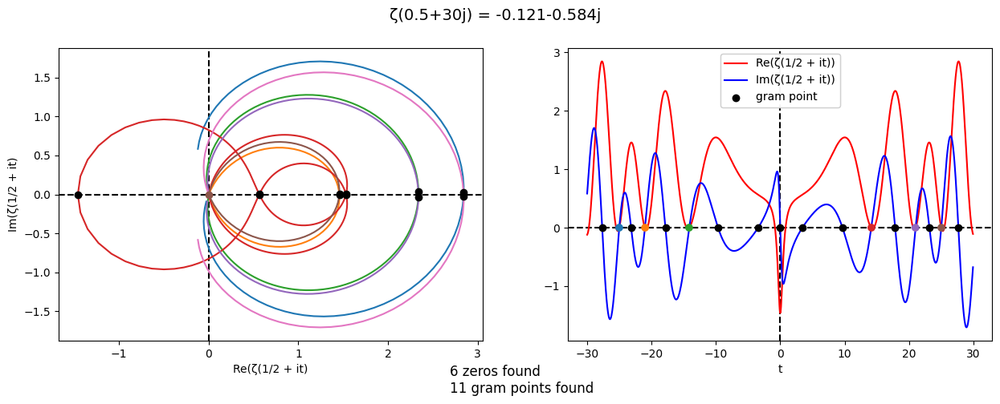

In [46]:
camera = animate()
anim = camera.animate()
anim.save('zeta_critical.gif', writer=animation.PillowWriter(fps=10))
# anim.save('zeta_critical.gif.mp4', writer=FFMpegWriter(fps=10))
_ = plt.show()

In [44]:
anim = camera.animate()
HTML(anim.to_jshtml(fps=10))

### widget

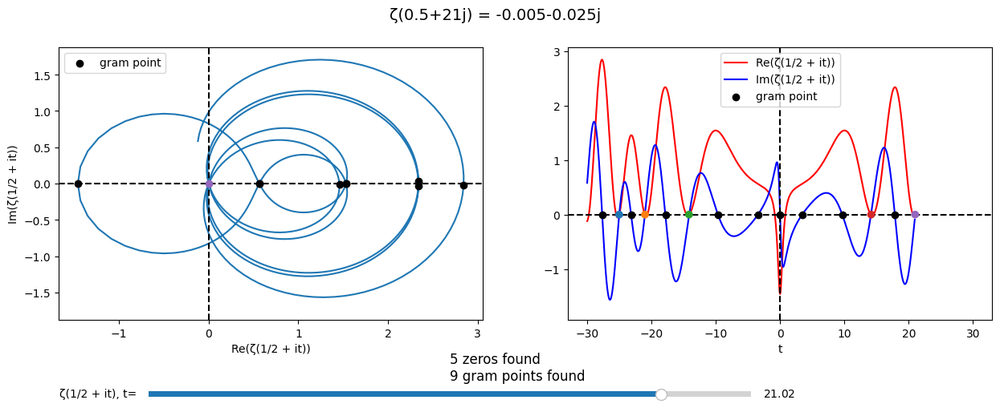

In [4]:
from matplotlib.widgets import Slider

fig, axs = plt.subplots(1,2, figsize=(15,5)) # horizontal
# create some extra space at the bottom for slider
plt.subplots_adjust(bottom=0.2)
ax_imag = plt.axes([0.2, 0.0, 0.5, 0.03])
imag_comp = Slider(ax_imag, 'ζ(1/2 + it), t=', -30.0, 30.0, 21.02)

plt.axes(axs[0])
l1,= plt.plot(y.real, y.imag)
scat1_gram = plt.scatter(y[gram_mask].real, y[gram_mask].imag, c='black', label='gram point', zorder=5)
scat1_zero = plt.scatter(0, 0, zorder=5)
plt.xlabel('Re(ζ(1/2 + it))')
plt.ylabel('Im(ζ(1/2 + it))')
plt.axhline(0, ls='--', c='k')
plt.axvline(0, ls='--', c='k')
plt.legend(loc='upper left')

plt.axes(axs[1])
l2_re, = plt.plot(imag_range, y.real, c='red', label='Re(ζ(1/2 + it))')
l2_im, = plt.plot(imag_range, y.imag, c='blue', label='Im(ζ(1/2 + it))')
scat2_zero = plt.scatter(zeta_zeros.imag, [0]*n_zeros, c='yellow', zorder=5)
scat2_gram = plt.scatter(gram_points.imag, [0]*n_gram_points, c='black', label='gram point', zorder=5)
plt.xlabel('t')
plt.axhline(0, ls='--', c='k')
plt.axvline(0, ls='--', c='k')

title = f'ζ() = '
title = plt.text(0.4, 0.95, title, fontsize=14, transform=fig.transFigure)
# set subtitle
subtitle = f' zeros found \ngram points found'
subtitle = plt.text(0.45, 0.05, subtitle, fontsize=12, transform=fig.transFigure)
plt.legend(loc='upper center')

def update(val):
    i = abs(imag_range - val).argmin()
    
    n_z = np.searchsorted(zeta_zeros.imag, val, side='right')
    n_g = np.searchsorted(np.sort(gram_points.imag), val, side='right')
    l1.set_data(y.real[:i], y.imag[:i])
    # cant set list of colors at once
    # c = []
    # for j, zero in enumerate(zeta_zeros[:n_z]):
    #   prev_indx = len(c)
    #   end_indx = np.where(x==zeta_zeros[n_z-1])[0][0]
    #   curve_len = end_indx - prev_indx
    #   c.append([colrs[j%len(colrs)]] * curve_len)
    # l1.set_color(c)
      
    
    l2_re.set_data(imag_range[:i], y.real[:i])
    l2_im.set_data(imag_range[:i], y.imag[:i])
    
    if n_g == 0:
      scat1_gram.set_visible(False)
      scat2_gram.set_visible(False)
    else:
      scat1_gram.set_visible(True)
      scat2_gram.set_visible(True)
      scat1_gram.set_offsets(list(zip(y[:i][gram_mask[:i]].real, y[:i][gram_mask[:i]].imag)))
      scat2_gram.set_offsets(list(zip(np.sort(gram_points.imag)[:n_g], [0]*len(gram_points[:n_g]))))
      
    if n_z == 0:
      scat1_zero.set_visible(False)
      scat2_zero.set_visible(False)
    else:
      scat1_zero.set_visible(True)
      scat2_zero.set_visible(True)
      c = colrs[(np.searchsorted(np.where(zeros_mask)[0],i,side='right')-1)%len(colrs)]
      scat1_zero.set_facecolors(c)
      c = colrs[np.arange(n_z) % len(colrs)]
      scat2_zero.set_offsets(list(zip(zeta_zeros.imag[:n_z], [0]*n_z)))
      scat2_zero.set_facecolors(c)
    
    title.set_text(f'ζ{np.round(x[i],3)} = {repr(np.round(y[i],3))[1:-1]}')
    subtitle.set_text(f'{n_z} zeros found \n{n_g} gram points found')
    
# Call update function when slider value is changed
update(imag_comp.val)
imag_comp.on_changed(update)

plt.show()